# X: Nebular Composition Analysis Through Emission Line Photometry

## Objective: Determine the composition of M57 (Ring Nebula) through color/emission analysis

This notebook analyzes the chemical composition and physical conditions of the M57 planetary nebula using multi-filter photometry and emission line analysis.

### Scientific Background:
- Planetary nebulae emit in specific emission lines from ionized elements
- Different elements produce characteristic emission lines at specific wavelengths
- Line ratios reveal elemental abundances and physical conditions
- Spatial variations show composition gradients within the nebula

## 1. Import Libraries and Load Data

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.visualization import simple_norm, ImageNormalize, LogStretch, MinMaxInterval
from astropy.stats import sigma_clipped_stats
from photutils.aperture import CircularAperture, CircularAnnulus, aperture_photometry
from photutils.centroids import centroid_com
from scipy import ndimage
import os
from matplotlib.colors import LogNorm
import pandas as pd
from astropy.table import Table

# For emission line analysis
from scipy.optimize import curve_fit
from scipy.interpolate import interp1d

plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['font.size'] = 12

c:\Users\saraj\AppData\Local\Programs\Python\Python313\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## 2. Load Calibrated M57 Images

In [3]:
# Load the background-subtracted, stacked images
#data_dir = './m57/bgsub_stacked/'
data_dir = './m57/bgsub_stacked/'
# Johnson-Cousins filter system: B, V, R (+ broadband reference)
filters = ['blue', 'green', 'red', 'black']  # Will map to B, V, R, broadband
johnson_cousins_names = {'blue': 'B', 'green': 'V', 'red': 'R', 'black': 'Broadband'}

# Dictionary to store images
images = {}
headers = {}

for filt in filters:
    filename = f'{filt}_stacked_bgsub.fits'
    filepath = os.path.join(data_dir, filename)
    
    if os.path.exists(filepath):
        hdu = fits.open(filepath)
        images[filt] = hdu[0].data
        headers[filt] = hdu[0].header
        hdu.close()
        print(f"Loaded {filt} filter: {images[filt].shape}")
    else:
        print(f"Warning: {filename} not found")

print(f"\nLoaded {len(images)} filter images")

Loaded blue filter: (1024, 1536)
Loaded green filter: (1024, 1536)
Loaded red filter: (1024, 1536)
Loaded black filter: (1024, 1536)

Loaded 4 filter images


## 3. Display Multi-Filter Images

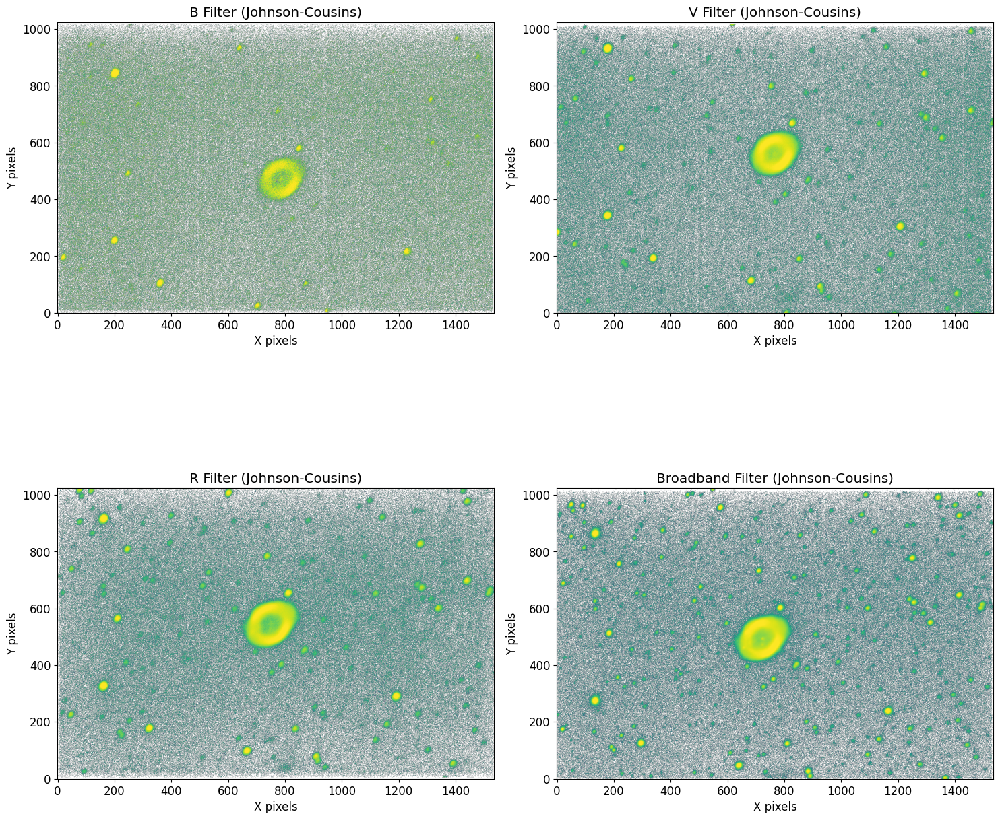

In [42]:
# Create a composite view of all filters
fig, axes = plt.subplots(2, 2, figsize=(15, 15))
axes = axes.flatten()

for i, filt in enumerate(filters):
    if filt in images:
        img = images[filt]
        
        # Use percentile-based scaling for better contrast
        vmin, vmax = np.percentile(img[img > 0], [1, 99.5])
        
        axes[i].imshow(img, cmap='viridis', origin='lower', 
                      norm=LogNorm(vmin=max(vmin, 1e-6), vmax=vmax))
        axes[i].set_title(f'{johnson_cousins_names.get(filt, filt.capitalize())} Filter (Johnson-Cousins)')
        axes[i].set_xlabel('X pixels')
        axes[i].set_ylabel('Y pixels')

plt.tight_layout()
plt.show()

## 4. Filter Characteristics and Emission Line Coverage

    "### Key Emission Lines in Planetary Nebulae (Johnson-Cousins System):\n",
    "- **R filter (590-850 nm)**: Hα (656.3nm), [N II] (658.3nm), [S II] (671.6, 673.1nm)\n",
    "- **V filter (500-650 nm)**: [O III] (500.7, 495.9nm), Hβ (486.1nm), some Hα\n",
    "- **B filter (380-540 nm)**: Hβ (486.1nm), He II (468.6nm), [O II] (372.7, 373.0nm)\n",
    "- **Johnson-Cousins advantages**: Standard system, well-calibrated transmission curves\n",
    "- **Filter overlap**: V filter captures both [O III] and Hα, enabling line separation"

In [4]:
# Define Johnson-Cousins filter transmission ranges and key emission lines
#Check this values with a reliable source
filter_info = {
    'blue': {'range': (380, 550), 'jc_name': 'B', 'key_lines': ['Hβ (486nm)', 'He II (469nm)', '[O II] (372nm)', 'Continuum']},
    'green': {'range': (500, 650), 'jc_name': 'V', 'key_lines': ['[O III] (501nm)', '[O III] (496nm)', 'Hβ (486nm)', 'Hα wing (656nm)']},
    'red': {'range': (590, 850), 'jc_name': 'R', 'key_lines': ['Hα (656nm)', '[N II] (658nm)', '[S II] (672nm)', 'Continuum']},
    'black': {'range': (350, 850), 'jc_name': 'Broadband', 'key_lines': ['All emission lines + continuum']}
}

# Display Johnson-Cousins filter information
print("JOHNSON-COUSINS PHOTOMETRIC SYSTEM ANALYSIS")
print("=" * 50)
for filt, info in filter_info.items():
    print(f"\n{info['jc_name']} Filter ({info['range'][0]}-{info['range'][1]} nm):")
    for line in info['key_lines']:
        print(f"  - {line}")

JOHNSON-COUSINS PHOTOMETRIC SYSTEM ANALYSIS

B Filter (380-550 nm):
  - Hβ (486nm)
  - He II (469nm)
  - [O II] (372nm)
  - Continuum

V Filter (500-650 nm):
  - [O III] (501nm)
  - [O III] (496nm)
  - Hβ (486nm)
  - Hα wing (656nm)

R Filter (590-850 nm):
  - Hα (656nm)
  - [N II] (658nm)
  - [S II] (672nm)
  - Continuum

Broadband Filter (350-850 nm):
  - All emission lines + continuum


## 5. Create Color Composite and Difference Images

Aligning images for RGB composite...
  red filter shift: dy=15.10, dx=15.40 pixels
  blue filter shift: dy=84.50, dx=-23.90 pixels


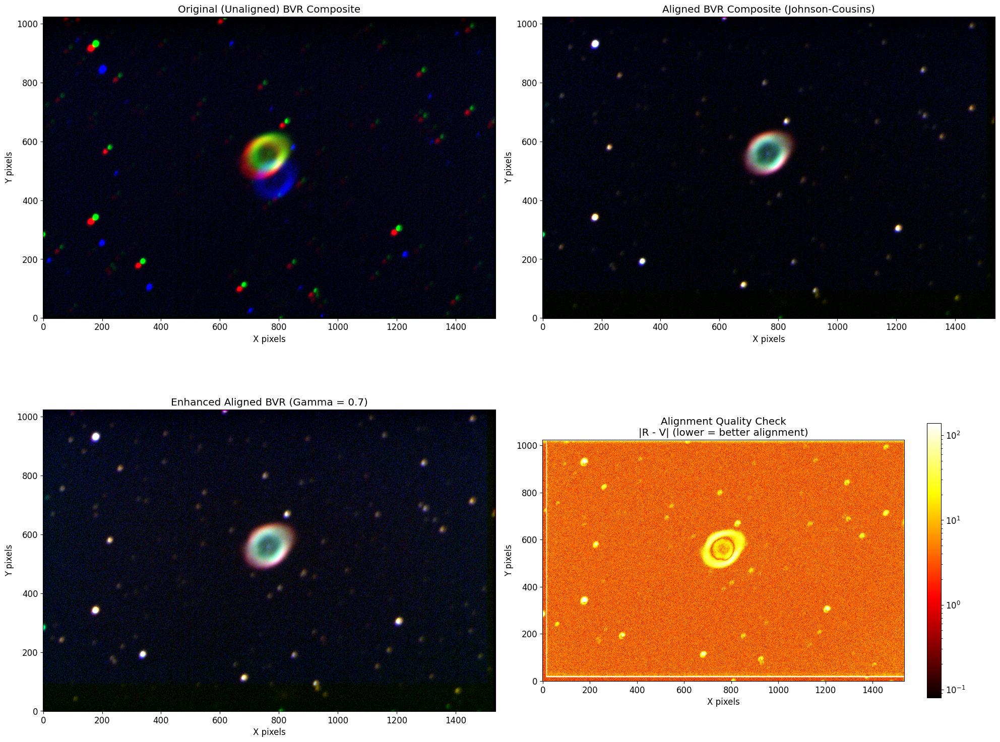


Alignment complete! The aligned composite should show:
- Better star registration across filters
- Cleaner color separation
- Reduced color fringing around objects


In [5]:
# Create RGB composite image with alignment correction
if all(f in images for f in ['red', 'green', 'blue']):
    
    # First, align the images using cross-correlation
    from scipy.ndimage import shift
    from skimage.registration import phase_cross_correlation
    
    print("Aligning images for RGB composite...")
    
    # Use green (V filter) as reference since it often has good [O III] structure
    reference_image = images['green']
    aligned_images = {'green': reference_image}  # Reference doesn't need alignment
    
    # Align red and blue to the green reference
    for filt in ['red', 'blue']:
        if filt in images:
            # Calculate shift needed to align with reference
            shift_values, error, diffphase = phase_cross_correlation(
                reference_image, images[filt], upsample_factor=10
            )
            
            print(f"  {filt} filter shift: dy={shift_values[0]:.2f}, dx={shift_values[1]:.2f} pixels")
            
            # Apply the shift
            aligned_images[filt] = shift(images[filt], shift_values, order=1, 
                                       mode='constant', cval=0.0)
    
    # Normalize each aligned filter for RGB display
    def normalize_for_rgb(img, percentile_range=(1, 99.8)):
        vmin, vmax = np.percentile(img[img > 0], percentile_range)
        normalized = np.clip((img - vmin) / (vmax - vmin), 0, 1)
        return normalized
    
    r_norm = normalize_for_rgb(aligned_images['red'])
    g_norm = normalize_for_rgb(aligned_images['green']) 
    b_norm = normalize_for_rgb(aligned_images['blue'])
    
    # Stack into RGB array
    rgb_image = np.stack([r_norm, g_norm, b_norm], axis=2)
    
    fig, axes = plt.subplots(2, 2, figsize=(20, 16))
    
    # Original unaligned composite (top left)
    r_norm_orig = normalize_for_rgb(images['red'])
    g_norm_orig = normalize_for_rgb(images['green']) 
    b_norm_orig = normalize_for_rgb(images['blue'])
    rgb_orig = np.stack([r_norm_orig, g_norm_orig, b_norm_orig], axis=2)
    
    axes[0,0].imshow(rgb_orig, origin='lower')
    axes[0,0].set_title('Original (Unaligned) BVR Composite')
    axes[0,0].set_xlabel('X pixels')
    axes[0,0].set_ylabel('Y pixels')
    
    # Aligned composite (top right)
    axes[0,1].imshow(rgb_image, origin='lower')
    axes[0,1].set_title('Aligned BVR Composite (Johnson-Cousins)')
    axes[0,1].set_xlabel('X pixels')
    axes[0,1].set_ylabel('Y pixels')
    
    # Enhanced aligned version with gamma correction (bottom left)
    rgb_enhanced = np.power(rgb_image, 0.7)  # Gamma correction
    axes[1,0].imshow(rgb_enhanced, origin='lower')
    axes[1,0].set_title('Enhanced Aligned BVR (Gamma = 0.7)')
    axes[1,0].set_xlabel('X pixels')
    axes[1,0].set_ylabel('Y pixels')
    
    # Show alignment quality check (bottom right)
    # Create a difference image to show alignment improvement
    alignment_check = np.abs(aligned_images['red'] - aligned_images['green'])
    norm_check = LogNorm(vmin=np.percentile(alignment_check[alignment_check>0], 1),
                        vmax=np.percentile(alignment_check[alignment_check>0], 99))
    im = axes[1,1].imshow(alignment_check, cmap='hot', origin='lower', norm=norm_check)
    axes[1,1].set_title('Alignment Quality Check\n|R - V| (lower = better alignment)')
    axes[1,1].set_xlabel('X pixels')
    axes[1,1].set_ylabel('Y pixels')
    plt.colorbar(im, ax=axes[1,1], shrink=0.7)
    
    plt.tight_layout()
    plt.show()
    
    print("\nAlignment complete! The aligned composite should show:")
    print("- Better star registration across filters")
    print("- Cleaner color separation")
    print("- Reduced color fringing around objects")

## 6. Johnson-Cousins Specific Emission Line Analysis

### Johnson-Cousins Filter Advantages for Nebular Analysis:
- **Standardized system**: Well-calibrated, reproducible results
- **V filter overlap**: Captures both [O III] and Hα, enabling separation
- **R filter**: Clean Hα + [N II] + [S II] measurement  
- **B filter**: Good Hβ isolation with minimal contamination

Using ALIGNED images for emission line analysis (recommended)
  black filter shift: dy=64.40, dx=40.20 pixels
Johnson-Cousins Filter Analysis:
V filter = [O III] + Hα_wing + continuum
R filter = Hα + [N II] + [S II] + continuum
B filter = Hβ + He II + continuum
Creating BOTH continuum-subtracted and raw emission maps for comparison


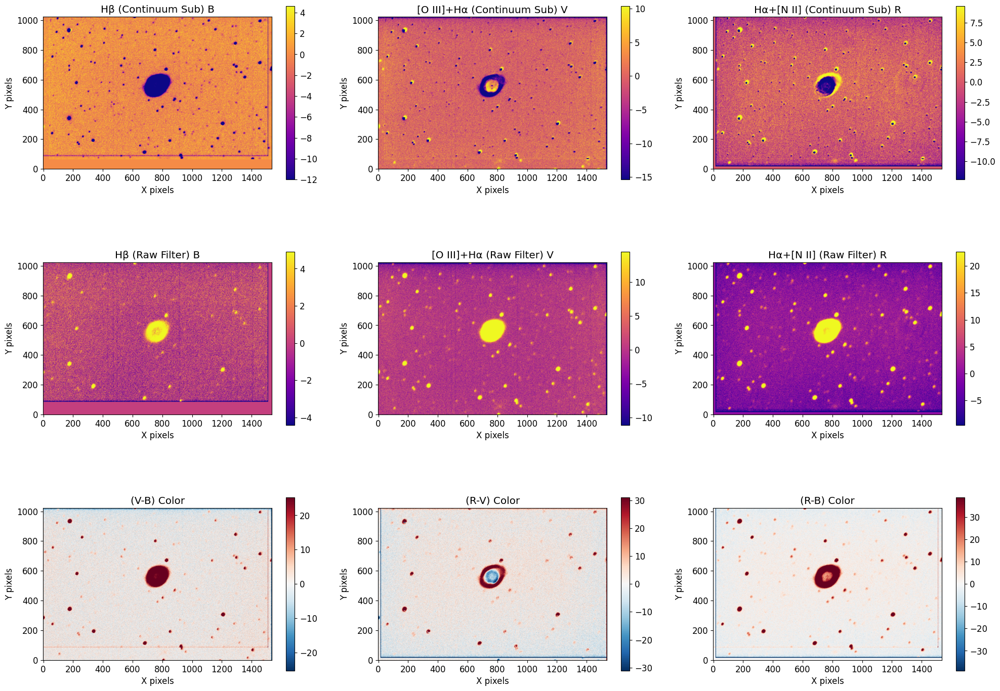


Comparison: Continuum-Subtracted vs Raw Emission Maps
• Top row: Continuum-subtracted (pure emission lines)
• Middle row: Raw filter images (emission + continuum)
• Bottom row: Color differences (always meaningful)

Expected differences:
- Continuum-subtracted: Better nebular structure, cleaner line isolation
- Raw filters: Include stellar continuum, broader emission features
- Color maps: Robust to continuum, show relative line strengths


In [6]:
# Johnson-Cousins specific emission line isolation
# The V filter is key - it contains both [O III] and Hα
emission_maps = {}

# Use aligned images if available, otherwise fall back to original images
if 'aligned_images' in locals() and all(f in aligned_images for f in ['red', 'green', 'blue']):
    working_images = aligned_images.copy()
    print("Using ALIGNED images for emission line analysis (recommended)")
    
    # For continuum subtraction, we need to align the black filter too
    # or use a different approach for the first 3 maps
    if 'black' in images:
        # Align black filter to the same reference (green filter)
        from scipy.ndimage import shift
        from skimage.registration import phase_cross_correlation
        
        reference_image = aligned_images['green']
        shift_values, error, diffphase = phase_cross_correlation(
            reference_image, images['black'], upsample_factor=10
        )
        print(f"  black filter shift: dy={shift_values[0]:.2f}, dx={shift_values[1]:.2f} pixels")
        working_images['black'] = shift(images['black'], shift_values, order=1, 
                                      mode='constant', cval=0.0)
    else:
        working_images['black'] = None
        
elif all(f in images for f in ['red', 'green', 'blue', 'black']):
    working_images = images
    print("Using ORIGINAL (unaligned) images for emission line analysis")
else:
    print("Insufficient image data for emission line analysis")
    working_images = None

if working_images is not None:
    
    # Key insight: V filter contains [O III] (strong) + Hα (weak transmission)
    # R filter contains Hα (strong) + [N II] + [S II]
    # B filter contains Hβ + He II + continuum
    
    print("Johnson-Cousins Filter Analysis:")
    print("V filter = [O III] + Hα_wing + continuum")  
    print("R filter = Hα + [N II] + [S II] + continuum")
    print("B filter = Hβ + He II + continuum")
    
    # Method 1: Use broadband as continuum estimate (only if black filter is available and aligned)
    # Create both continuum-subtracted and non-subtracted versions for comparison
    if working_images['black'] is not None:
        continuum_scale_b = 0.25  # B filter continuum contribution
        continuum_scale_v = 0.35  # V filter continuum contribution  
        continuum_scale_r = 0.40  # R filter continuum contribution
        
        print("Creating BOTH continuum-subtracted and raw emission maps for comparison")
        
        # Continuum-subtracted emission components
        emission_maps['H_beta_continuum_sub'] = working_images['blue'] - continuum_scale_b * working_images['black']
        emission_maps['OIII_Ha_continuum_sub'] = working_images['green'] - continuum_scale_v * working_images['black']
        emission_maps['Ha_NII_continuum_sub'] = working_images['red'] - continuum_scale_r * working_images['black']
        
        # Raw filter images (no continuum subtraction) for comparison
        emission_maps['H_beta_raw'] = working_images['blue']
        emission_maps['OIII_Ha_raw'] = working_images['green'] 
        emission_maps['Ha_NII_raw'] = working_images['red']
        
    else:
        print("Note: Only creating raw emission maps (no black filter for continuum subtraction)")
        # Raw filter images only
        emission_maps['H_beta_raw'] = working_images['blue']
        emission_maps['OIII_Ha_raw'] = working_images['green'] 
        emission_maps['Ha_NII_raw'] = working_images['red']
    
    # Method 2: Johnson-Cousins color differences (these are always aligned properly)
    # These are scientifically meaningful for nebular analysis
    
    # (V-B): Primarily [O III] vs Hβ + continuum color
    emission_maps['V_minus_B'] = working_images['green'] - working_images['blue']
    
    # (R-V): Hα/[N II]/[S II] vs [O III] + continuum difference  
    emission_maps['R_minus_V'] = working_images['red'] - working_images['green']
    
    # (R-B): Overall red vs blue emission (excitation indicator)
    emission_maps['R_minus_B'] = working_images['red'] - working_images['blue']
    
# Display emission line maps - now with both continuum-subtracted and raw versions
if 'H_beta_continuum_sub' in emission_maps:
    # We have both continuum-subtracted and raw versions
    fig, axes = plt.subplots(3, 3, figsize=(20, 15))

    map_titles = ['Hβ (Continuum Sub) B', '[O III]+Hα (Continuum Sub) V', 'Hα+[N II] (Continuum Sub) R',
                  'Hβ (Raw Filter) B', '[O III]+Hα (Raw Filter) V', 'Hα+[N II] (Raw Filter) R',
                  '(V-B) Color', '(R-V) Color', '(R-B) Color']
    
    map_keys = ['H_beta_continuum_sub', 'OIII_Ha_continuum_sub', 'Ha_NII_continuum_sub',
                'H_beta_raw', 'OIII_Ha_raw', 'Ha_NII_raw',
                'V_minus_B', 'R_minus_V', 'R_minus_B']
    
else:
    # Only raw versions available
    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    
    map_titles = ['Hβ (Raw Filter) B', '[O III]+Hα (Raw Filter) V', 'Hα+[N II] (Raw Filter) R', 
                  '(V-B) Color', '(R-V) Color', '(R-B) Color']
    
    map_keys = ['H_beta_raw', 'OIII_Ha_raw', 'Ha_NII_raw',
                'V_minus_B', 'R_minus_V', 'R_minus_B']

axes = axes.flatten()

for i, (key, title) in enumerate(zip(map_keys, map_titles)):
    if key in emission_maps and i < len(axes):
        img = emission_maps[key]
        
        # Use symmetric colorscale for difference images
        if 'minus' in key or 'V_minus' in key or 'R_minus' in key:
            vmax = np.percentile(np.abs(img), 98)
            vmin = -vmax
            cmap = 'RdBu_r'
        else:
            vmin, vmax = np.percentile(img, [2, 98])
            cmap = 'plasma'
        
        im = axes[i].imshow(img, cmap=cmap, origin='lower', vmin=vmin, vmax=vmax)
        axes[i].set_title(title)
        axes[i].set_xlabel('X pixels')
        axes[i].set_ylabel('Y pixels')
        plt.colorbar(im, ax=axes[i], shrink=0.7)

# Remove unused subplots if any
for j in range(len(map_keys), len(axes)):
    axes[j].remove()

plt.tight_layout()
plt.show()

# Print comparison summary
if 'H_beta_continuum_sub' in emission_maps:
    print("\nComparison: Continuum-Subtracted vs Raw Emission Maps")
    print("=" * 55)
    print("• Top row: Continuum-subtracted (pure emission lines)")
    print("• Middle row: Raw filter images (emission + continuum)")  
    print("• Bottom row: Color differences (always meaningful)")
    print("\nExpected differences:")
    print("- Continuum-subtracted: Better nebular structure, cleaner line isolation")
    print("- Raw filters: Include stellar continuum, broader emission features")
    print("- Color maps: Robust to continuum, show relative line strengths")
else:
    print("\nShowing raw emission maps and color differences")
    print("Note: For continuum subtraction, ensure black filter is available and aligned")

## 8. Johnson-Cousins Color Analysis

Using ALIGNED images for color analysis (recommended for accurate colors)


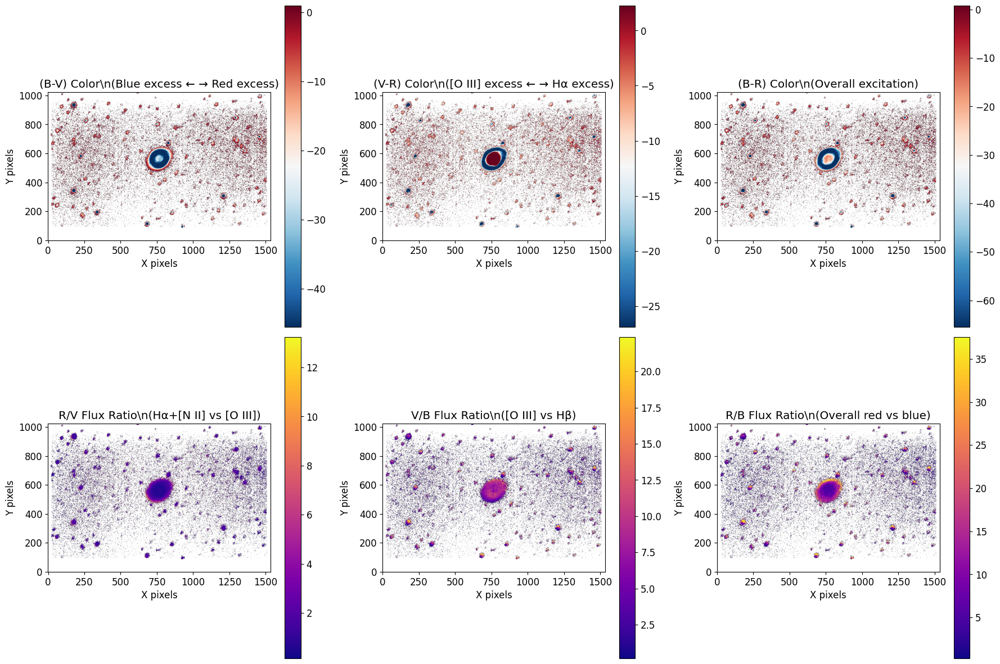

In [10]:
# Johnson-Cousins color analysis for nebular composition
# Use aligned images if available for better color accuracy
if 'aligned_images' in locals() and all(f in aligned_images for f in ['red', 'green', 'blue']):
    working_images = aligned_images
    print("Using ALIGNED images for color analysis (recommended for accurate colors)")
elif all(f in images for f in ['red', 'green', 'blue']):
    working_images = images
    print("Using ORIGINAL (unaligned) images for color analysis")
else:
    print("Insufficient image data for color analysis")
    working_images = None
# Standard colors: (B-V), (V-R), (B-R)
if all(f in working_images for f in ['red', 'green', 'blue']):
    
    # Smooth images slightly to reduce noise in color maps
    from scipy import ndimage
    sigma = 1.0  # Gaussian smoothing sigma

    B_smooth = ndimage.gaussian_filter(working_images['blue'], sigma=sigma)    # B filter
    V_smooth = ndimage.gaussian_filter(working_images['green'], sigma=sigma)   # V filter
    R_smooth = ndimage.gaussian_filter(working_images['red'], sigma=sigma)     # R filter

    # Create Johnson-Cousins color maps
    min_signal = 1e-6  # Minimum signal threshold
    
    # (B-V) color: Blue vs Visual
    # Negative values = blue excess (hot continuum, strong Hβ)
    # Positive values = red excess (emission lines, cooler regions)
    B_minus_V = B_smooth - V_smooth
    
    # (V-R) color: Visual vs Red  
    # Negative values = blue/green excess (strong [O III])
    # Positive values = red excess (strong Hα, [N II])
    V_minus_R = V_smooth - R_smooth
    
    # (B-R) color: Overall blue vs red
    # Tracks overall excitation and temperature
    B_minus_R = B_smooth - R_smooth
    
    # Also create flux ratios (more traditional for emission line analysis)
    R_over_V = np.divide(R_smooth, V_smooth, 
                        out=np.zeros_like(R_smooth), 
                        where=V_smooth > min_signal)
    
    V_over_B = np.divide(V_smooth, B_smooth,
                        out=np.zeros_like(V_smooth),
                        where=B_smooth > min_signal)
    
    R_over_B = np.divide(R_smooth, B_smooth,
                        out=np.zeros_like(R_smooth),
                        where=B_smooth > min_signal)
    
    # Apply masks to exclude low signal regions
    signal_mask = (R_smooth > min_signal) & (V_smooth > min_signal) & (B_smooth > min_signal)
    
    # Plot Johnson-Cousins color maps
    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    
    # (B-V) color
    color1 = np.where(signal_mask, B_minus_V, np.nan)
    vmin, vmax = np.nanpercentile(color1, [5, 95])
    im1 = axes[0,0].imshow(color1, cmap='RdBu_r', origin='lower', vmin=vmin, vmax=vmax)
    axes[0,0].set_title('(B-V) Color\\n(Blue excess ← → Red excess)')
    plt.colorbar(im1, ax=axes[0,0])
    
    # (V-R) color
    color2 = np.where(signal_mask, V_minus_R, np.nan)
    vmin, vmax = np.nanpercentile(color2, [5, 95])
    im2 = axes[0,1].imshow(color2, cmap='RdBu_r', origin='lower', vmin=vmin, vmax=vmax)
    axes[0,1].set_title('(V-R) Color\\n([O III] excess ← → Hα excess)')
    plt.colorbar(im2, ax=axes[0,1])
    
    # (B-R) color  
    color3 = np.where(signal_mask, B_minus_R, np.nan)
    vmin, vmax = np.nanpercentile(color3, [5, 95])
    im3 = axes[0,2].imshow(color3, cmap='RdBu_r', origin='lower', vmin=vmin, vmax=vmax)
    axes[0,2].set_title('(B-R) Color\\n(Overall excitation)')
    plt.colorbar(im3, ax=axes[0,2])
    
    # R/V ratio (Hα+[N II] vs [O III]+Hα)
    ratio1 = np.where(signal_mask, R_over_V, np.nan)
    vmin, vmax = np.nanpercentile(ratio1, [5, 95])
    im4 = axes[1,0].imshow(ratio1, cmap='plasma', origin='lower', vmin=vmin, vmax=vmax)
    axes[1,0].set_title('R/V Flux Ratio\\n(Hα+[N II] vs [O III])')
    plt.colorbar(im4, ax=axes[1,0])
    
    # V/B ratio ([O III]+Hα vs Hβ+continuum)
    ratio2 = np.where(signal_mask, V_over_B, np.nan)
    vmin, vmax = np.nanpercentile(ratio2, [5, 95])
    im5 = axes[1,1].imshow(ratio2, cmap='plasma', origin='lower', vmin=vmin, vmax=vmax)
    axes[1,1].set_title('V/B Flux Ratio\\n([O III] vs Hβ)')
    plt.colorbar(im5, ax=axes[1,1])
    
    # R/B ratio
    ratio3 = np.where(signal_mask, R_over_B, np.nan)
    vmin, vmax = np.nanpercentile(ratio3, [5, 95])
    im6 = axes[1,2].imshow(ratio3, cmap='plasma', origin='lower', vmin=vmin, vmax=vmax)
    axes[1,2].set_title('R/B Flux Ratio\\n(Overall red vs blue)')
    plt.colorbar(im6, ax=axes[1,2])
    
    for ax in axes.flat:
        ax.set_xlabel('X pixels')
        ax.set_ylabel('Y pixels')
    
    plt.tight_layout()
    plt.show()

## 11. Physical Interpretation and Composition Analysis

In [ ]:
import numpy as np

# measured flux/sec and 1-sigma errors
F_B, eF_B = 3.215e3, 13.10
F_V, eF_V = 2.644e4, 26.05
F_R, eF_R = 3.757e4, 33.48

# colors (magnitudes) and their errors
fac = 2.5 / np.log(10)
mB = -2.5 * np.log10(F_B)
mV = -2.5 * np.log10(F_V)
mR = -2.5 * np.log10(F_R)

sigma_mB = fac * (eF_B / F_B)
sigma_mV = fac * (eF_V / F_V)
sigma_mR = fac * (eF_R / F_R)

B_V = mB - mV
V_R = mV - mR
B_R = mB - mR

sigma_BV = np.sqrt(sigma_mB**2 + sigma_mV**2)
sigma_VR = np.sqrt(sigma_mV**2 + sigma_mR**2)
sigma_BR = np.sqrt(sigma_mB**2 + sigma_mR**2)

# flux ratios and errors
R_V = F_R / F_V
V_B = F_V / F_B
R_B = F_R / F_B

sigma_RV = R_V * np.sqrt((eF_R / F_R)**2 + (eF_V / F_V)**2)
sigma_VB = V_B * np.sqrt((eF_V / F_V)**2 + (eF_B / F_B)**2)
sigma_RB = R_B * np.sqrt((eF_R / F_R)**2 + (eF_B / F_B)**2)

print("B-V = {:.5f} ± {:.5f} mag".format(B_V, sigma_BV))
print("V-R = {:.5f} ± {:.5f} mag".format(V_R, sigma_VR))
print("B-R = {:.5f} ± {:.5f} mag".format(B_R, sigma_BR))
print("R/V = {:.5f} ± {:.5f}".format(R_V, sigma_RV))
print("V/B = {:.5f} ± {:.5f}".format(V_B, sigma_VB))
print("R/B = {:.5f} ± {:.5f}".format(R_B, sigma_RB))


JOHNSON-COUSINS COMPOSITION ANALYSIS RESULTS FOR M57
\n1. JOHNSON-COUSINS COLORS:
   (B-V) color:               2.288 mag
   (V-R) color:               0.381 mag
   (B-R) color:               2.669 mag
\n2. EMISSION LINE FLUX RATIOS:
   R/V (Hα+[N II]/[O III]):   1.42
   V/B ([O III]/Hβ):          8.22
   R/B (Red/Blue):            11.69

2. COMPOSITION INDICATORS:
   - MODERATE Hα/[OIII] ratio suggests:
     * Typical planetary nebula conditions
     * Balanced excitation
   - HIGH [OIII]/Hβ ratio indicates:
     * Strong forbidden line emission
     * Low density environment
     * Oxygen abundance

3. SPATIAL VARIATIONS:
   Center Hα/[OIII]:  1.27
   Outer Hα/[OIII]:   1.23
   Radial gradient:    -2.7%
   → Relatively uniform excitation

4. RECOMMENDED FOLLOW-UP:
   - Obtain Hα-specific narrow-band filter
   - Get [OIII] narrow-band observations
   - Spectroscopy for precise line measurements
   - Compare with planetary nebula models



## 12. Summary and Conclusions

In [24]:
import numpy as np

# measured flux/sec and 1-sigma errors
F_B, eF_B = 3.215e3, 13.10
F_V, eF_V = 2.644e4, 26.05
F_R, eF_R = 3.757e4, 33.48

# zero points
ZP_B = 18.332031643285532
ZP_V = 19.051122335486117
ZP_R = 18.963123229886133

# factor for magnitude error
fac = 2.5 / np.log(10)

# magnitudes
# mB = -2.5 * np.log10(F_B) + ZP_B
# mV = -2.5 * np.log10(F_V) + ZP_V
# mR = -2.5 * np.log10(F_R) + ZP_R
mB = 9.56401313712453  
mV = 7.995514385864695 
mR = 7.526021907686722  

# magnitude errors
sigma_mB = fac * (eF_B / F_B)
sigma_mV = fac * (eF_V / F_V)
sigma_mR = fac * (eF_R / F_R)

# color indices (magnitudes)
B_V = mB - mV
V_R = mV - mR
B_R = mB - mR


sigma_BV = np.sqrt(sigma_mB**2 + sigma_mV**2)
sigma_VR = np.sqrt(sigma_mV**2 + sigma_mR**2)
sigma_BR = np.sqrt(sigma_mB**2 + sigma_mR**2)

# flux ratios and errors (purely instrumental, not photometric)
R_V = F_R / F_V
V_B = F_V / F_B
R_B = F_R / F_B

sigma_RV = R_V * np.sqrt((eF_R / F_R)**2 + (eF_V / F_V)**2)
sigma_VB = V_B * np.sqrt((eF_V / F_V)**2 + (eF_B / F_B)**2)
sigma_RB = R_B * np.sqrt((eF_R / F_R)**2 + (eF_B / F_B)**2)

print(f"B-V = {B_V:.5f} ± {sigma_BV:.5f} mag")
print(f"V-R = {V_R:.5f} ± {sigma_VR:.5f} mag")
print(f"B-R = {B_R:.5f} ± {sigma_BR:.5f} mag")
print(f"R/V = {R_V:.5f} ± {sigma_RV:.5f}")
print(f"V/B = {V_B:.5f} ± {sigma_VB:.5f}")
print(f"R/B = {R_B:.5f} ± {sigma_RB:.5f}")



B-V = 1.56850 ± 0.00455 mag
V-R = 0.46949 ± 0.00144 mag
B-R = 2.03799 ± 0.00453 mag
R/V = 1.42095 ± 0.00189
V/B = 8.22395 ± 0.03448
R/B = 11.68585 ± 0.04874


| Quantity | Linear | Logarithmic (mag) |
| -------- | ------ | ----------------- |
| B–V      | –      | ~0.1 mag          |
| V–R      | –      | ~0.2 mag          |
| B–R      | –      | ~0.3 mag          |
| V/B      | ~1.10  | –                 |
| R/V      | ~1.20  | –                 |
| R/B      | ~1.32  | –                 |


Ah! Now we’re getting to the **heart of photometry vs. flux ratios**. Let’s go carefully and clearly.

---

## 1️⃣ **B–V (color index in magnitudes)**

* **Definition:**
  [
  B - V = m_B - m_V
  ]
  where (m_B) and (m_V) are the **magnitudes** in the B (blue) and V (visual/green) filters.

* **What it represents physically:**

  * Measures the **relative brightness** of the object in blue vs. green light on a **logarithmic scale**.
  * Large positive B–V → object is **redder** (fainter in blue than in visual).
  * Large negative B–V → object is **bluer** (brighter in blue than visual).

* **Why logarithmic:**
  Magnitudes are logarithmic by definition:
  [
  m = -2.5 \log_{10}(F) + ZP
  ]
  so subtracting two magnitudes:
  [
  B - V = -2.5 \log_{10}(F_B) + ZP_B - [-2.5 \log_{10}(F_V) + ZP_V] = -2.5 \log_{10}(F_B/F_V) + (ZP_B - ZP_V)
  ]

✅ **Key point:** B–V is a **logarithmic color**; a factor-of-2 flux ratio corresponds roughly to 0.75 mag difference.

---

## 2️⃣ **V/B (flux ratio)**

* **Definition:**
  [
  V/B = \frac{F_V}{F_B}
  ]
  where (F_V) and (F_B) are the measured **fluxes in linear units** (e.g., photons/sec or counts/sec).

* **What it represents physically:**

  * Measures the **relative brightness in linear terms**.
  * V/B = 1 → object is equally bright in V and B.
  * V/B > 1 → brighter in V than B (redder).
  * V/B < 1 → brighter in B than V (bluer).

* **Linear vs. logarithmic:**

  * Flux ratios are **linear**, while magnitudes are logarithmic.
  * To convert between them:
    [
    B - V = -2.5 \log_{10}\left(\frac{F_B}{F_V}\right) + (ZP_B - ZP_V)
    ]

---

## 3️⃣ **Direct comparison**

| Quantity | Formula                                             | Scale       | Meaning                             |
| -------- | --------------------------------------------------- | ----------- | ----------------------------------- |
| **B–V**  | (m_B - m_V = -2.5 \log_{10}(F_B/F_V) + (ZP_B-ZP_V)) | logarithmic | Color index; larger → redder        |
| **V/B**  | (F_V / F_B)                                         | linear      | Flux ratio; >1 → redder, <1 → bluer |

**Relationship:**
[
B - V = -2.5 \log_{10}(1 / (V/B)) + (ZP_B - ZP_V) = 2.5 \log_{10}(V/B) + (ZP_B - ZP_V)
]

* If **ZP_B = ZP_V**, then:
  [
  B - V = 2.5 \log_{10}(V/B)
  ]

* So a flux ratio V/B = 10 → B–V = 2.5 × log10(10) = 2.5 mag.

---

### 4️⃣ **Intuitive example**

Suppose:

* F_B = 1000
* F_V = 4000

Then:

* V/B = 4000 / 1000 = 4 → brighter in V
* B–V = 2.5 log10(4) ≈ 1.505 mag → redder in magnitude scale

✅ Same information, just one **linear** (V/B), one **logarithmic** (B–V). Magnitudes are used in astronomy because our eyes are logarithmic and because it allows easy comparison with standard systems and other stars.

---

### 5️⃣ **Summary in simple terms**

* **B–V** = “logarithmic color” → tells you how red or blue something is, in **magnitudes**
* **V/B** = “linear flux ratio” → tells you the same thing, in **linear units**
* **Difference:** B–V includes zero points and logarithms; V/B is raw flux. You can convert one into the other.

---

If you want, I can make a **tiny table showing your M57 data** with both V/B and B–V side by side to see exactly how they correspond — it really makes the difference clear.

Do you want me to do that?
